## Domain

Smartphone, Electronics

## Context

India is the second largest market globally for smartphones after China. About 134 million smartphones were sold across India
in the year 2017 and is estimated to increase to about 442 million in 2022. India ranked second in the average time spent on mobile web by
smartphone users across Asia Pacific. The combination of very high sales volumes and the average smartphone consumer behaviour has
made India a very attractive market for foreign vendors. As per Consumer behaviour, 97% of consumers turn to a search engine when they
are buying a product vs. 15% who turn to social media. If a seller succeeds to publish smartphones based on user’s behaviour/choice at the
right place, there are 90% chances that user will enquire for the same. This Case Study is targeted to build a recommendation system
based on individual consumer’s behaviour or choice.

## Data Description 

• author : name of the person who gave the rating

• country : country the person who gave the rating belongs to

• data : date of the rating

• domain: website from which the rating was taken from

• extract: rating content

• language: language in which the rating was given

• product: name of the product/mobile phone for which the rating was given

• score: average rating for the phone

• score_max: highest rating given for the phone

• source: source from where the rating was taken

## Project Objective

We will build a recommendation system using popularity based and collaborative filtering methods to recommend
mobile phones to a user which are most popular and personalised respectively.

### Import the Libraries 

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 
import os
import glob
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from zipfile import ZipFile
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import math
import json
import time

# import sklearn.external.joblib as extjoblib

import joblib
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestNeighbors
import scipy.sparse
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import svds
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

#import the reqired libraries

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import warnings; warnings.simplefilter('ignore')
from surprise.model_selection import cross_validate
from surprise import NormalPredictor
from surprise import KNNBasic
from surprise import KNNWithMeans
from surprise import KNNWithZScore
from surprise import KNNBaseline
from surprise import SVD
from surprise import BaselineOnly
from surprise import SVDpp
from surprise import NMF
from surprise import SlopeOne
from surprise import CoClustering
from surprise.accuracy import rmse
from surprise import accuracy

from scipy.spatial.distance import correlation, cosine
import ipywidgets as widgets
from IPython.display import display, clear_output
from sklearn.metrics import pairwise_distances
from sklearn.metrics import mean_squared_error
from math import sqrt
import sys, os
from contextlib import contextmanager
from colorama import Fore, Back, Style
%matplotlib inline

# filterwarnings to ignore all unnecessary warnings and logs
import warnings
warnings.filterwarnings('ignore')
#declaring metric as global which can be changed by the user later
global metric
metric='cosine'

### Import the Data Files

In [2]:
phone_user_review_1=pd.read_csv("phone_user_review_file_1.csv")
phone_user_review_2=pd.read_csv("phone_user_review_file_2.csv")
phone_user_review_3=pd.read_csv("phone_user_review_file_3.csv")
phone_user_review_4=pd.read_csv("phone_user_review_file_4.csv")
phone_user_review_5=pd.read_csv("phone_user_review_file_5.csv")
phone_user_review_6=pd.read_csv("phone_user_review_file_6.csv")

### Merging all the Data Files into one Data Frame


In [3]:
Data = pd.concat([phone_user_review_1,phone_user_review_2, phone_user_review_3, phone_user_review_4, phone_user_review_5,phone_user_review_6])

In [4]:
Data.head()

,phone_url,date,lang,country,source,domain,score,score_max,extract,author,product
0,/cellphones/samsung-galaxy-s8/,5/2/2017,en,us,Verizon Wireless,verizonwireless.com,10.0,10.0,As a diehard Samsung fan who has had every Sam...,CarolAnn35,Samsung Galaxy S8
1,/cellphones/samsung-galaxy-s8/,4/28/2017,en,us,Phone Arena,phonearena.com,10.0,10.0,Love the phone. the phone is sleek and smooth ...,james0923,Samsung Galaxy S8
2,/cellphones/samsung-galaxy-s8/,5/4/2017,en,us,Amazon,amazon.com,6.0,10.0,Adequate feel. Nice heft. Processor's still sl...,R. Craig,"Samsung Galaxy S8 (64GB) G950U 5.8"" 4G LTE Unl..."
3,/cellphones/samsung-galaxy-s8/,5/2/2017,en,us,Samsung,samsung.com,9.2,10.0,Never disappointed. One of the reasons I've be...,Buster2020,Samsung Galaxy S8 64GB (AT&T)
4,/cellphones/samsung-galaxy-s8/,5/11/2017,en,us,Verizon Wireless,verizonwireless.com,4.0,10.0,I've now found that i'm in a group of people t...,S Ate Mine,Samsung Galaxy S8


In [5]:
Data.shape


(1415133, 11)

In [6]:
rows, columns = Data.shape
print(Fore.RED + "No of rows: ", Style.RESET_ALL,rows) 
print(Fore.RED + "No of columns: ", Style.RESET_ALL,columns) 

No of rows:   1415133
No of columns:   11


### Check for Duplicate Values|

In [7]:
# It is very important to check and remove data duplicates. 
# Else our model may break or report overly optimistic / pessimistic performance results

dupes=Data.duplicated()
print(' The number of duplicates in the dataset are:',sum(dupes), '\n')
dupes_record=pd.DataFrame(Data[dupes])
print(' The duplicate observations are:') 
dupes_record

 The number of duplicates in the dataset are: 6412 

 The duplicate observations are:


,phone_url,date,lang,country,source,domain,score,score_max,extract,author,product
342,/cellphones/samsung-galaxy-s8/,4/26/2017,nl,nl,Coolblue,coolblue.nl,9.6,10.0,Ik vind het tot nu toe een heel erg aangenaam ...,Stefanie Hinneman,Samsung Galaxy S8 Zwart
343,/cellphones/samsung-galaxy-s8/,4/26/2017,nl,nl,Coolblue,coolblue.nl,9.6,10.0,Ik vind het tot nu toe een heel erg aangenaam ...,Stefanie Hinneman,Samsung Galaxy S8 Zwart
371,/cellphones/samsung-galaxy-s8/,4/25/2017,nl,nl,Coolblue,coolblue.nl,9.6,10.0,Tot nu toe in de eerste dagen weinig tot geen ...,Robin Winckens,Samsung Galaxy S8 Zwart
452,/cellphones/samsung-galaxy-s8/,4/25/2017,nl,nl,Coolblue,coolblue.nl,10.0,10.0,Wat een huge scherm!,B Yapar,Samsung Galaxy S8 Zwart
3718,/cellphones/samsung-galaxy-s6-edgeplus/,10/4/2015,en,us,Amazon,amazon.com,10.0,10.0,"For readers, my opinions on this device (ATT 3...",FrozenCloud,"Samsung Galaxy S6 Edge+, Black 64GB (Verizon W..."
...,...,...,...,...,...,...,...,...,...,...,...
146836,/cellphones/nokia-8850/,8/31/2010,ru,ru,Yandex,market.yandex.ru,10.0,10.0,"Просто отличный телефон, который приятно лежит...",NaN,Nokia 8850
146838,/cellphones/nokia-8850/,6/25/2010,ru,ru,Yandex,market.yandex.ru,10.0,10.0,"За свои деньги, 1000 долларов которые он когда...",NaN,Nokia 8850
158911,/cellphones/samsung-sgh-600/,4/30/2015,tr,tr,Cepworld,cepworld.com,NaN,NaN,varsa satan 05312614607,muhsin,Samsung (936) SGH-600
160164,/cellphones/philips-genie-2000/,8/20/2000,it,it,Ciao,ciao.it,8.0,10.0,"Il Genie e' un buon telefono, scorrimente del ...",tonyblack,Philips Genie 2000


### Drop the Duplicate Values

In [8]:
Data_1 = Data.drop_duplicates() 

In [9]:
Data_1.shape

(1408721, 11)

In [10]:
dupes_1=Data_1.duplicated()
print(' The number of duplicates in the dataset are:',sum(dupes_1), '\n')

 The number of duplicates in the dataset are: 0 



### Keeping only 1000000 data samples, using random state=612.

In [11]:
Sample_Data = Data_1.sample(n = 1000000, random_state = 612) 

In [12]:
Sample_Data.head()

,phone_url,date,lang,country,source,domain,score,score_max,extract,author,product
347247,/cellphones/nokia-6301/,2/21/2011,en,gb,Dooyoo,dooyoo.co.uk,10.0,10.0,This phone has lasted the test of time and has...,gilay28,Nokia 6301
80368,/cellphones/apple-iphone-4s/,13/1/2012,en,us,Amazon,amazon.com,10.0,10.0,"For years, I've been using Android phones. Fro...",Stacy G.,"Apple iPhone 4S Verizon Cellphone, 16GB, White"
46940,/cellphones/samsung-galaxy-note-3-neo-4g-n7505/,8/21/2014,de,de,Amazon,amazon.de,10.0,10.0,Habe mir das Samsung Galaxy Note 3 Neo als Nac...,BulldoZer,"Samsung Galaxy Note 3 Neo Smartphone (13,94 cm..."
283355,/cellphones/nokia-5030/,4/12/2010,en,us,HandCellPhone,handcellphone.com,6.0,10.0,nokia 5030 me game kesa dalay,vinod kumar,Nokia 5030
61365,/cellphones/huawei-p9-plus/,8/2/2016,it,it,Amazon,amazon.it,10.0,10.0,"Beh, dopo Iphone e Lumia sono passato al mondo...",Giorgio,"Huawei P9 Plus Smartphone, LTE, Display 5.5'' ..."


In [13]:
rows, columns = Sample_Data.shape
print(Fore.RED + "No of rows: ", Style.RESET_ALL,rows) 
print(Fore.RED + "No of columns: ", Style.RESET_ALL,columns) 

No of rows:   1000000
No of columns:   11


In [14]:
# After dropping duplicates

Sample_Data.drop_duplicates(keep="first")
rows, columns = Sample_Data.shape
print(Fore.YELLOW + "No of rows: ", Style.RESET_ALL,rows) 
print(Fore.YELLOW + "No of columns: ", Style.RESET_ALL,columns)

,phone_url,date,lang,country,source,domain,score,score_max,extract,author,product
347247,/cellphones/nokia-6301/,2/21/2011,en,gb,Dooyoo,dooyoo.co.uk,10.0,10.0,This phone has lasted the test of time and has...,gilay28,Nokia 6301
80368,/cellphones/apple-iphone-4s/,13/1/2012,en,us,Amazon,amazon.com,10.0,10.0,"For years, I've been using Android phones. Fro...",Stacy G.,"Apple iPhone 4S Verizon Cellphone, 16GB, White"
46940,/cellphones/samsung-galaxy-note-3-neo-4g-n7505/,8/21/2014,de,de,Amazon,amazon.de,10.0,10.0,Habe mir das Samsung Galaxy Note 3 Neo als Nac...,BulldoZer,"Samsung Galaxy Note 3 Neo Smartphone (13,94 cm..."
283355,/cellphones/nokia-5030/,4/12/2010,en,us,HandCellPhone,handcellphone.com,6.0,10.0,nokia 5030 me game kesa dalay,vinod kumar,Nokia 5030
61365,/cellphones/huawei-p9-plus/,8/2/2016,it,it,Amazon,amazon.it,10.0,10.0,"Beh, dopo Iphone e Lumia sono passato al mondo...",Giorgio,"Huawei P9 Plus Smartphone, LTE, Display 5.5'' ..."
...,...,...,...,...,...,...,...,...,...,...,...
88941,/cellphones/samsung-galaxy-s5-mini/,12/23/2016,de,de,Amazon,amazon.de,2.0,10.0,War mit dem Handy im Großen und Ganzen sehr zu...,Sandra,"Samsung Galaxy S5 mini Smartphone (4,5 Zoll (1..."
10723,/cellphones/huawei-g610/,3/24/2014,es,es,Amazon,amazon.es,10.0,10.0,Le compré este móvil a mi mujer. Lleva con el ...,R. d´Orrio,Huawei Ascend G610 - Smartphone libre Android ...
135063,/cellphones/sony-ericsson-t610/,5/28/2003,de,de,Amazon,amazon.de,8.0,10.0,Ein gutes Gerät zu einem fairen Preis. Sehr po...,Daniel Sindl,Sony Ericsson T610 Handy silber
17231,/cellphones/doogee-x5-max-pro/,8/13/2016,en,gb,Amazon,amazon.co.uk,10.0,10.0,Great. Fast and responsive. Able to run apps w...,Arj,DOOGEE X5 Max Pro 5.0'' IPS 4G Smartphone Andr...


No of rows:   1000000
No of columns:   11


### Exploratory Data Analysis

#### Checking for Data type of columns

In [15]:
Sample_Data.dtypes

phone_url     object
date          object
lang          object
country       object
source        object
domain        object
score        float64
score_max    float64
extract       object
author        object
product       object
dtype: object

#### Datetime conversion using astype for date column:

In [16]:
Sample_Data['date'] = Sample_Data['date'].astype('datetime64[ns]')

#### Int Convertion using astype for score column and also Rouding of score column to the nearest Integer

In [17]:
Sample_Data['score'] = Sample_Data['score'].round().astype('Int64')

#### Int Convertion using astype for score_max column and rouding to the nearest Integer

In [18]:
Sample_Data['score_max'] = Sample_Data['score_max'].round().astype('Int64')

#### Checking Data Types Again

In [19]:
Sample_Data.dtypes

phone_url            object
date         datetime64[ns]
lang                 object
country              object
source               object
domain               object
score                 Int64
score_max             Int64
extract              object
author               object
product              object
dtype: object

### Categorical & Numerical Columns 

In [20]:
def cols():
    cat_cols = [col for col in Sample_Data.columns if Sample_Data[col].dtypes == "O"]
    if len(cat_cols) == 0:
        print("There is no Categorical Column")
    else:
        print("Number of Categorical Column: ", len(cat_cols),"\n",cat_cols)
    
    num_cols = [col for col in Sample_Data.columns if Sample_Data[col].dtypes != "O"]
    if len(num_cols) == 0:
        print("There is no Numerical Column")
    print("Number of Numerical Columns: ", len(num_cols),"\n",num_cols)
cols()

Number of Categorical Column:  8 
 ['phone_url', 'lang', 'country', 'source', 'domain', 'extract', 'author', 'product']
Number of Numerical Columns:  3 
 ['date', 'score', 'score_max']


### Drop irrelevant features and Keeping features like Author, Product, Score and Score Max

In [21]:
Sample_Data.drop(['phone_url', 'extract', 'domain', 'date','lang', 'country', 'source'], axis = 1,inplace = True)


In [22]:
Sample_Data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000000 entries, 347247 to 279967
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   score      955333 non-null  Int64 
 1   score_max  955333 non-null  Int64 
 2   author     956121 non-null  object
 3   product    999999 non-null  object
dtypes: Int64(2), object(2)
memory usage: 40.1+ MB


In [23]:
Sample_Data.shape

(1000000, 4)

### Checking missing values

In [24]:
#displaying in each column how many null values are there

Sample_Data.apply(lambda x: sum(x.isnull()))

score        44667
score_max    44667
author       43879
product          1
dtype: int64

In [25]:
# determine the threshold for missing values

def assess_NA(data):
    """
    Returns a pandas dataframe denoting the total number of NA values and the percentage of NA values in each column.
    The column names are noted on the index.
    
    Parameters
    ----------
    data: dataframe
    """
    # pandas series denoting features and the sum of their null values
    
    null_sum = data.isnull().sum()# instantiate columns for missing data
    total = null_sum.sort_values(ascending=False)
    percent = ( ((null_sum / len(data.index))*100).round(2) ).sort_values(ascending=False)
    
    # concatenate along the columns to create the complete dataframe
    df_NA = pd.concat([total, percent], axis=1, keys=['Number of NA', 'Percent NA'])
    
    # drop rows that don't have any missing data; omit if you want to keep all rows
    df_NA = df_NA[ (df_NA.T != 0).any() ]
    
    return df_NA 

In [26]:
df_NA = assess_NA(Sample_Data)
df_NA

,Number of NA,Percent NA
score,44667,4.47
score_max,44667,4.47
author,43879,4.39
product,1,0.00


<AxesSubplot:>

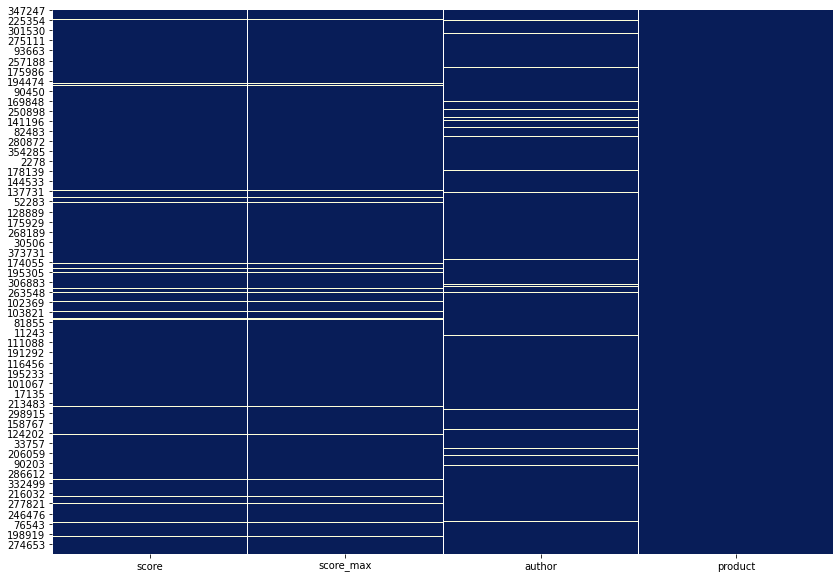

In [27]:
fig , ax = plt.subplots(figsize = (14,10))
sns.heatmap(Sample_Data.isnull() , cbar = False, cmap = "YlGnBu_r")

In [28]:
# To get number of categories in missing value columns

print("Number of Categories in: ")
for ColName in Sample_Data[['author','product']]:
    print("{} = {}".format(ColName,       len(Sample_Data[ColName].unique())))

Number of Categories in: 
author = 596846
product = 56328


### Impute / Replace Missing Values with Median


#### Imputing missing data with median value on Numerical Data 

In [29]:
Sample_Data['score'].fillna(Sample_Data['score'].median(), inplace = True)

In [30]:
Sample_Data['score_max'].fillna(Sample_Data['score_max'].median(), inplace = True)

#### Imputing missing data with mode value on Categorical Data

In [31]:
Sample_Data['product'].fillna(Sample_Data['product'].mode()[0], inplace = True)

In [32]:
Sample_Data['author'].fillna(Sample_Data['author'].mode()[0], inplace = True)

#### Again Checking for Threshold for missing values

In [33]:
df_NA = assess_NA(Sample_Data)
df_NA

,Number of NA,Percent NA


In [34]:
Sample_Data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000000 entries, 347247 to 279967
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype 
---  ------     --------------    ----- 
 0   score      1000000 non-null  Int64 
 1   score_max  1000000 non-null  Int64 
 2   author     1000000 non-null  object
 3   product    1000000 non-null  object
dtypes: Int64(2), object(2)
memory usage: 40.1+ MB


### Univariate Analysis

As rule of thumb, skewness can be interpreted like this:

Skewness

* Fairly Symmetrical -0.5 to 0.5
* Moderate Skewed -0.5 to -1.0 and 0.5 to 1.0
* Highly Skewed < -1.0 and > 1.0

#### Skewness along the index axis  

In [35]:
Sample_Data.skew(axis = 0, skipna = True) 

score       -1.297767
score_max    0.000000
dtype: float64

<AxesSubplot:xlabel='score', ylabel='Density'>

<AxesSubplot:xlabel='score_max', ylabel='Density'>

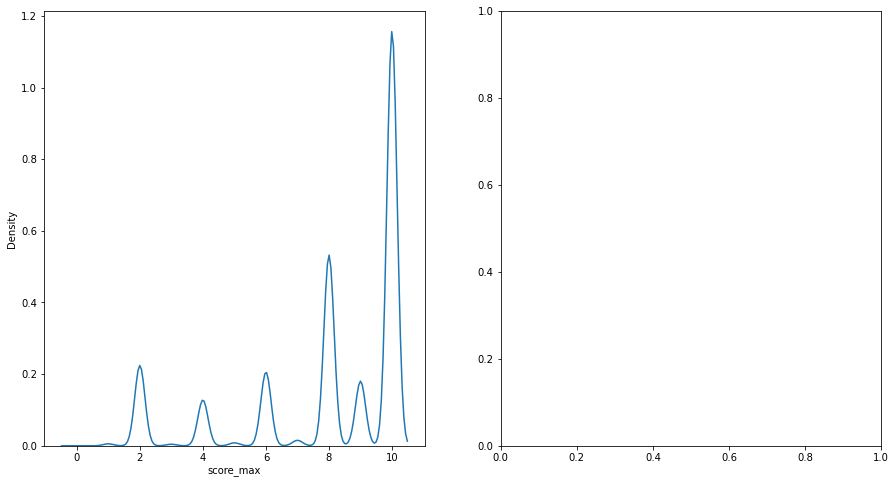

score       -1.297767
score_max    0.000000
dtype: float64


In [36]:
fig,ax=plt.subplots(1,2,figsize=(15,8))
sns.distplot(Sample_Data['score'],ax=ax[0],kde=True,hist=False)
sns.distplot(Sample_Data['score_max'],ax=ax[0],kde=True,hist=False)
plt.show()
print(Sample_Data.skew())

#### Kurtosis along the index axis 

In [37]:
Sample_Data.kurt(axis = 0, skipna = True)

score        0.49169
score_max    0.00000
dtype: float64

### 5 point summary of Dataframe

In [38]:
Sample_Data.describe([0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99]).transpose()

,count,mean,std,min,10%,25%,50%,75%,90%,95%,99%,max
score,1000000.0,8.051221,2.566812,0.0,4.0,8.0,9.0,10.0,10.0,10.0,10.0,10.0
score_max,1000000.0,10.000000,0.000000,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0


#### Score value Count

In [39]:
Sample_Data.score.value_counts()

10    470252
8     216220
2      91031
6      83661
9      73267
4      51940
7       6202
5       3346
1       2278
3       1776
0         27
Name: score, dtype: Int64

#### Summary statistics of 'rating' variable

In [40]:
Sample_Data['score'].describe([0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99]).transpose()

count    1000000.000000
mean           8.051221
std            2.566812
min            0.000000
10%            4.000000
25%            8.000000
50%            9.000000
75%           10.000000
90%           10.000000
95%           10.000000
99%           10.000000
max           10.000000
Name: score, dtype: float64

#### Minimum and Maximum Ratings 

In [41]:
print('The minimum score is: %d' %(Sample_Data['score'].min()))
print('The maximum score is: %d' %(Sample_Data['score'].max()))

The minimum score is: 0
The maximum score is: 10


Obsevation: Ratings(Score) are on scale of 0-10

#### Distribution of Ratings(Score)

In [42]:
from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

data = Sample_Data['score'].value_counts().sort_index(ascending=False)
trace = go.Bar(x = data.index,
               text = ['{:.1f} %'.format(val) for val in (data.values / Sample_Data.shape[0] * 100)],
               textposition = 'auto',
               textfont = dict(color = '#000000'),
               y = data.values,
               )
# Create layout
layout = dict(title = 'Distribution Of {} Phone-ratings'.format(Sample_Data.shape[0]),
              xaxis = dict(title = 'Rating'),
              yaxis = dict(title = 'Count'))
# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

Observation: We can see that more that 80% of all scorings in the data are 6,7,8, 9 and 10, and very few ratings around 15%-18% are in the lower ratings range.



#### Ratings Distribution By Product (Phone)

In [44]:
# Number of ratings per phone
data = Sample_Data.groupby('product')['score'].count().clip(upper=50)

# Create trace
trace = go.Histogram(x = data.values,
                     name = 'Scores',
                     xbins = dict(start = 0,
                                  end = 50,
                                  size = 2))
# Create layout
layout = go.Layout(title = 'Distribution Of Number of Scores Per Phone (Clipped at 50)',
                   xaxis = dict(title = 'Number of Scores Per Phone'),
                   yaxis = dict(title = 'Count'),
                   bargap = 0.2)

# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)


### The Most Rated Products Top 10

In [45]:
Sample_Data.groupby('product')['score'].count().reset_index().sort_values('score', ascending=False)[:10]

,product,score
21743,"Lenovo Vibe K4 Note (White,16GB)",3701
21742,"Lenovo Vibe K4 Note (Black, 16GB)",3093
31894,"OnePlus 3 (Graphite, 64 GB)",2889
31895,"OnePlus 3 (Soft Gold, 64 GB)",2522
15714,Huawei P8lite zwart / 16 GB,1895
37623,Samsung Galaxy Express I8730,1889
21746,"Lenovo Vibe K5 (Gold, VoLTE update)",1801
41032,Samsung Galaxy S6 zwart / 32 GB,1669
28094,Nokia 5800 XpressMusic,1518
21748,"Lenovo Vibe K5 (Grey, VoLTE update)",1502


#### Ratings Distribution By Authors (Users)


In [46]:
# Number of ratings per book
data = Sample_Data.groupby('author')['score'].count().clip(upper=50)

# Create trace
trace = go.Histogram(x = data.values,
                     name = 'Scores',
                     xbins = dict(start = 0,
                                  end = 50,
                                  size = 2))
# Create layout
layout = go.Layout(title = 'Distribution Of Number of Scores Per User (Clipped at 50)',
                   xaxis = dict(title = 'Number of Scores Per User'),
                   yaxis = dict(title = 'Count'),
                   bargap = 0.2)

# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

### Top 10 Users with most number of reviews

In [47]:
Sample_Data.groupby('author')['score'].count().reset_index().sort_values('score', ascending=False)[:10]

,author,score
22793,Amazon Customer,98479
72580,Cliente Amazon,13634
429480,e-bit,5948
72558,Client d'Amazon,5500
23105,Amazon Kunde,3307
31169,Anonymous,1946
430872,einer Kundin,1885
430870,einem Kunden,1379
558471,unknown,1212
31170,Anonymous,1014


Observation: Most of the users gave more than 5 ratings, and very few users gave many ratings, although the most productive user have given 98479 ratings.

### Selecting the data with products having more than 50 ratings and users who have given more than 50 ratings. Reporting the shape of the final dataset.

In [48]:
min_phone_ratings = 50
filter_products = Sample_Data['product'].value_counts() > min_phone_ratings
filter_products = filter_products[filter_products].index.tolist()

min_user_ratings = 50
filter_users = Sample_Data['author'].value_counts() > min_user_ratings
filter_users = filter_users[filter_users].index.tolist()

Data_New = Sample_Data[(Sample_Data['product'].isin(filter_products)) & (Sample_Data['author'].isin(filter_users))]
print('The original data frame shape:\t{}'.format(Sample_Data.shape))
print('The new data frame shape:\t{}'.format(Data_New.shape))

The original data frame shape:	(1000000, 4)
The new data frame shape:	(129478, 4)


### Count of Unique Elements

In [49]:
uniqueValues = Data_New.nunique()
print('Count of unique values in each column :')
print(uniqueValues)

Count of unique values in each column :
score          10
score_max       1
author        645
product      4061
dtype: int64


In [50]:
print(Fore.RED + "The total phones are",Style.RESET_ALL,f"{Data_New['product'].count()},", Fore.BLUE + "from those the unique product types are", Style.RESET_ALL, f"{Data_New['product'].value_counts().shape[0]}.")

The total phones are  129478, from those the unique product types are  4061.


In [51]:
print(Fore.RED + "The total users are",Style.RESET_ALL,f"{Data_New['author'].count()},", Fore.BLUE + "from those the unique author types are", Style.RESET_ALL, f"{Data_New['author'].value_counts().shape[0]}.")

The total users are  129478, from those the unique author types are  645.


## Popularity Based Model

In [52]:
Mean=pd.DataFrame(Data_New.groupby('product')['score'].mean()) 
Mean.head()

,score
product,
3220,10.0
5.5-Inch Unlocked Lenovo A850 3G Smartphone-(960x540) Quad Core 4GB MT6582m 1331MHz Android 4.2 Dual Camera +Dual SIM -Black (Rooted + Google Play),5.6
6682 / 6681,9.0
"AICEK Coque ASUS ZenFone 3 Max ZC520TL, AICEK Etui Silicone Gel ASUS ZenFone 3 Max Housse Antichoc ZenFone 3 Max Transparente Souple Coque de Protection pour ASUS ZenFone 3 Max(5.2 Pouces)",9.555556
"AICEK Coque ASUS ZenFone 3 ZE520KL, AICEK Etui Silicone Gel ASUS ZenFone 3 Housse Antichoc ZenFone 3 Transparente Souple Coque de Protection pour ASUS ZenFone 3(5.2 Pouces)",8.666667


In [53]:
Data_New.groupby('product')['score'].mean().sort_values(ascending=False).head()  

product
3220                                                    10.0
Apple iPhone 5 64GB                                     10.0
Sony Ericsson V800                                      10.0
Samsung Smartphone Samsung Galaxy A5 2016 16 Go Noir    10.0
Sony Ericsson Sparkling White W302 Handy                10.0
Name: score, dtype: Float64

In [54]:
Data_New.groupby('product')['score'].count().sort_values(ascending=False).head()  

product
Lenovo Vibe K4 Note (White,16GB)       2191
Lenovo Vibe K4 Note (Black, 16GB)      1827
OnePlus 3 (Graphite, 64 GB)            1303
OnePlus 3 (Soft Gold, 64 GB)           1234
Lenovo Vibe K5 (Gold, VoLTE update)    1126
Name: score, dtype: int64

In [55]:
ratings_mean_count = pd.DataFrame(Data_New.groupby('product')['score'].mean()) 

In [56]:
ratings_mean_count['rating_counts'] = pd.DataFrame(Data_New.groupby('product')['score'].count()) 

### Top 5 mobile phones based on popularity based model.

In [57]:
ratings_mean_count.head()  

,score,rating_counts
product,,
3220,10.0,1
5.5-Inch Unlocked Lenovo A850 3G Smartphone-(960x540) Quad Core 4GB MT6582m 1331MHz Android 4.2 Dual Camera +Dual SIM -Black (Rooted + Google Play),5.6,5
6682 / 6681,9.0,2
"AICEK Coque ASUS ZenFone 3 Max ZC520TL, AICEK Etui Silicone Gel ASUS ZenFone 3 Max Housse Antichoc ZenFone 3 Max Transparente Souple Coque de Protection pour ASUS ZenFone 3 Max(5.2 Pouces)",9.555556,18
"AICEK Coque ASUS ZenFone 3 ZE520KL, AICEK Etui Silicone Gel ASUS ZenFone 3 Housse Antichoc ZenFone 3 Transparente Souple Coque de Protection pour ASUS ZenFone 3(5.2 Pouces)",8.666667,21


#### Consider only ratings from 1-10 and leave 0s in column Score

In [58]:
Data_New['score'].unique()

<IntegerArray>
[8, 10, 6, 2, 9, 4, 1, 3, 7, 5]
Length: 10, dtype: Int64

In [59]:
#Hence segragating implicit and explict ratings datasets

ratings_explicit = Data_New[Data_New.score != 0]
ratings_implicit = Data_New[Data_New.score == 0]

In [60]:
print(Data_New.shape)
print(ratings_explicit.shape)
print(ratings_implicit.shape)

(129478, 4)
(129478, 4)
(0, 4)


In [61]:
# Top 10 users based on rating

most_rated = ratings_explicit.groupby('author').size().sort_values(ascending=False)[:10]
most_rated

author
Amazon Customer    68549
Cliente Amazon      6931
e-bit               4751
Client d'Amazon     2539
Amazon Kunde        2077
einer Kundin        1856
einem Kunden        1338
Anonymous            965
Anonymous            652
Александр            506
dtype: int64

In [62]:
# print(sample_df)

counts = ratings_explicit['author'].value_counts()
Data_Final = ratings_explicit[ratings_explicit['author'].isin(counts[counts >= 50].index)]

In [63]:
counts_data = pd.value_counts(Data_Final['author'])
counts_data

Amazon Customer       68549
Cliente Amazon         6931
e-bit                  4751
Client d'Amazon        2539
Amazon Kunde           2077
                      ...  
George                   50
huliye                   50
Pseudonym                50
Hans                     50
?????????????????�       50
Name: author, Length: 274, dtype: int64

In [64]:
Data_Final = Data_Final[Data_Final['author'].isin(counts_data[counts_data >= 50].index)]


In [65]:
Data_Final.head()

,score,score_max,author,product
114568,8,10,Amazon Customer,ZTE Z Max 2 16GB Unlocked GSM 4G LTE Quad-Core...
26725,10,10,Amazon Customer,Nokia 6131
129841,10,10,Amazon Customer,HTC Desire 610
350506,8,10,Amazon-Kunde,"Samsung Galaxy S5 Smartphone (5,1 Zoll (12,9 c..."
62555,8,10,Michael,LG G2 D800 GSM 4G LTE Unlocked Smartphone with...


In [66]:
from surprise import Dataset,Reader
from surprise.model_selection import cross_validate
from surprise import NormalPredictor


reader = Reader(rating_scale=(1, 10))

In [67]:
Data_Final.shape

(117702, 4)

In [68]:
Data_Main = Dataset.load_from_df(Data_Final[['author', 'product', 'score']], reader)

In [69]:
Data_Main.df.head()

,author,product,score
114568,Amazon Customer,ZTE Z Max 2 16GB Unlocked GSM 4G LTE Quad-Core...,8
26725,Amazon Customer,Nokia 6131,10
129841,Amazon Customer,HTC Desire 610,10
350506,Amazon-Kunde,"Samsung Galaxy S5 Smartphone (5,1 Zoll (12,9 c...",8
62555,Michael,LG G2 D800 GSM 4G LTE Unlocked Smartphone with...,8


## Collaborative filtering model using SVD from surprise library

In [70]:
from collections import defaultdict

from surprise import SVD
from surprise import Dataset,Reader


In [71]:
reader = Reader(rating_scale=(1, 10))
Data_Main = Dataset.load_from_df(Data_Final[['author', 'product', 'score']], reader)

In [72]:
trainset = Data_Main.build_full_trainset()

In [73]:
trainset

In [74]:
trainset.ur

defaultdict(list,
            {0: [(0, 8.0),
              (1, 10.0),
              (2, 10.0),
              (5, 10.0),
              (7, 10.0),
              (9, 10.0),
              (12, 10.0),
              (14, 8.0),
              (15, 6.0),
              (16, 10.0),
              (19, 10.0),
              (20, 10.0),
              (21, 2.0),
              (22, 9.0),
              (23, 4.0),
              (25, 4.0),
              (26, 2.0),
              (27, 10.0),
              (29, 6.0),
              (16, 8.0),
              (37, 1.0),
              (38, 2.0),
              (39, 6.0),
              (40, 2.0),
              (42, 4.0),
              (45, 8.0),
              (46, 8.0),
              (47, 2.0),
              (48, 10.0),
              (50, 10.0),
              (26, 8.0),
              (53, 10.0),
              (54, 8.0),
              (55, 2.0),
              (56, 9.0),
              (57, 2.0),
              (59, 10.0),
              (60, 10.0),
              (26, 2

In [75]:
algo = SVD()
algo.fit(trainset)

In [76]:
# Than predict ratings for all pairs (u, i) that are NOT in the training set.

testset = trainset.build_anti_testset()

In [77]:
testset

[('Amazon Customer',
  'Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G)',
  7.854250564986152),
 ('Amazon Customer', 'Apple iPhone 7 Plus 5,5" 128 GB', 7.854250564986152),
 ('Amazon Customer', 'Vodafone (69) 945', 7.854250564986152),
 ('Amazon Customer',
  'Buyus Etui Housse Luxe Portefeuille Samsung Galaxy J3 (2016) SM-J320F avec Stylet et 3 Films Inclus',
  7.854250564986152),
 ('Amazon Customer', 'Samsung Galaxy S6 32GB (T-Mobile)', 7.854250564986152),
 ('Amazon Customer', 'Nokia 6600i Slide Cep Telefonu', 7.854250564986152),
 ('Amazon Customer',
  'Smartphone Asus ZenFone 2 Laser ZE550KL 16GB',
  7.854250564986152),
 ('Amazon Customer',
  'Lenovo Motorola Moto E 2a Generazione Smartphone, LTE, 8 GB, RAM 1 GB, Bianco [Italia]',
  7.854250564986152),
 ('Amazon Customer',
  'Nokia 105 Telefono Cellulare, Nero [Italia]',
  7.854250564986152),
 ('Amazon Customer', 'Samsung Galaxy S7 32GB (T-Mobile)', 7.854250564986152),
 ('Amazon Customer',
  'Samsung Galaxy mini 2 S6

In [78]:
predictions = algo.test(testset)

In [82]:
predictions

[Prediction(uid='Amazon Customer', iid='Samsung Galaxy S7 Smartphone, 12,9 cm (5,1 Zoll) Display, LTE (4G)', r_ui=7.854250564986152, est=8.04118498430076, details={'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Apple iPhone 7 Plus 5,5" 128 GB', r_ui=7.854250564986152, est=7.802564845931761, details={'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Vodafone (69) 945', r_ui=7.854250564986152, est=7.469604339271908, details={'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Buyus Etui Housse Luxe Portefeuille Samsung Galaxy J3 (2016) SM-J320F avec Stylet et 3 Films Inclus', r_ui=7.854250564986152, est=7.950069910227544, details={'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Samsung Galaxy S6 32GB (T-Mobile)', r_ui=7.854250564986152, est=7.528325707032209, details={'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Nokia 6600i Slide Cep Telefonu', r_ui=7.854250564986152, est=7.883641259063619, detai

In [80]:
def get_top_n(predictions, n=5):
    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n

In [83]:
top_n = get_top_n(predictions, n=5)

In [84]:
top_n

defaultdict(list,
            {'Amazon Customer': [('Honor 7 Smartphone 4G, Display Full HD 5.2 Pollici, Processore Kirin 935 Octa Core 2.2 GHz, 16 GB Memoria Interna, 3 GB RAM, Fotocamera 20 MP, Argento',
               9.458327973180962),
              ('Huawei Mate S Smartphone, Display 5,5 pollici, Memoria 32 GB, Android 5.1, Champagne',
               9.14300389026898),
              ('Honor 6 Smartphone (5 pollici, Touchscreen, Octa-Core, 3GB RAM, 16GB ROM, fotocamera principale da 13MP, fotocamera frontale da 5MP, LTE CAT6, Android 4.4, EmotionUI 2.3, SIM singola) Bianco',
               8.989478888449042),
              ('Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero',
               8.972907745129165),
              ('Samsung Galaxy S3 Neo - Smartphone libre Android (pantalla 4.8", cámara 8 Mp, 16 GB, Quad-Core 1.4 GHz, 1536 MB RAM), azul (importado)',
               8.970051467593693)],
             'Amazon-Kunde': [('Huawei Ascend P7 - L10 - Smartphone libre Android (pan

In [85]:
# Print the recommended items for each user
for uid, user_ratings in top_n.items():
    print(uid, [iid for (iid, _) in user_ratings])

Amazon Customer ['Honor 7 Smartphone 4G, Display Full HD 5.2 Pollici, Processore Kirin 935 Octa Core 2.2 GHz, 16 GB Memoria Interna, 3 GB RAM, Fotocamera 20 MP, Argento', 'Huawei Mate S Smartphone, Display 5,5 pollici, Memoria 32 GB, Android 5.1, Champagne', 'Honor 6 Smartphone (5 pollici, Touchscreen, Octa-Core, 3GB RAM, 16GB ROM, fotocamera principale da 13MP, fotocamera frontale da 5MP, LTE CAT6, Android 4.4, EmotionUI 2.3, SIM singola) Bianco', 'Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero', 'Samsung Galaxy S3 Neo - Smartphone libre Android (pantalla 4.8", cámara 8 Mp, 16 GB, Quad-Core 1.4 GHz, 1536 MB RAM), azul (importado)']
Amazon-Kunde ['Huawei Ascend P7 - L10 - Smartphone libre Android (pantalla 5", cámara 13 MP, 16 GB, Quad-Core 1.8 GHz, 2.0 GB RAM) negro', 'HTC One Smartphone, Display 4.7 Pollici, Fotocamera Ultrapixel, 32 GB, Processore Quad Core da 1.7 GHz, 2 GB RAM...', 'LG 500G Prepaid Phone (Tracfone)', 'Motorola Moto G (3rd Generation) - White- 8 GB - Global GSM U

In [86]:
# get RMSE
print("SVM Model : Test Set")
accuracy.rmse(predictions, verbose=True)

SVM Model : Test Set
RMSE: 0.8291


0.8290963380157548

In [87]:
from surprise.model_selection import GridSearchCV

grid = {'n_epochs': [5, 10, 20, 30], 
        'lr_all': [.0025, .005, .001, .01]}

gs = GridSearchCV(SVD, grid, measures=['rmse'], cv=5)
gs.fit(Data_Main)

print(gs.best_score['rmse'])
print(gs.best_params['rmse'])

2.5769015466106198
{'n_epochs': 20, 'lr_all': 0.001}


## Collaborative iltering model using kNNWithMeans from surprise (User-Based)


In [88]:
from surprise import KNNWithMeans
from surprise import Dataset
from surprise import accuracy
from surprise.model_selection import train_test_split

In [89]:
Data_Main = Dataset.load_from_df(Data_Final[['author', 'product', 'score']], reader)


In [90]:
trainset, testset = train_test_split(Data_Main, test_size=.15)

In [91]:
#User Based is True
algo = KNNWithMeans(k=50, sim_options={'name': 'pearson_baseline', 'user_based': True})
algo.fit(trainset)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.


In [92]:
# run the trained model against the testset
test_pred = algo.test(testset)

In [93]:
test_pred

[Prediction(uid='Thomas', iid='Nokia LUMIA520N Smartphone débloqué Windows Phone Bluetooth Noir', r_ui=8.0, est=7.536, details={'actual_k': 0, 'was_impossible': False}),
 Prediction(uid='einem Kunden', iid='Apple iPhone 7 4,7" 32 GB', r_ui=10.0, est=9.84, details={'actual_k': 50, 'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Lenovo Used Lenovo Zuk Z1 (Space Grey, 64GB)', r_ui=10.0, est=5.719999999999999, details={'actual_k': 50, 'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Lenovo Vibe K5 (Grey, VoLTE update)', r_ui=10.0, est=6.4799999999999995, details={'actual_k': 50, 'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Samsung Galaxy S II GT-I9100', r_ui=10.0, est=9.155390718478161, details={'actual_k': 46, 'was_impossible': False}),
 Prediction(uid='Мария', iid='Sony Xperia M (белый)', r_ui=5.0, est=8.797150046603017, details={'actual_k': 23, 'was_impossible': False}),
 Prediction(uid="Client d'Amazon", iid='Samsung Galaxy S5 

In [94]:
def get_top_n(test_pred, n=5):
    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in test_pred:
        top_n[uid].append((iid, est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n

In [95]:
top_n = get_top_n(test_pred, n=5)

In [96]:
top_n

defaultdict(list,
            {'Thomas': [('Samsung Galaxy Note 4 Smartphone (5,7 Zoll (14,5 cm) Touch-Display, 32 GB Speicher, Android 4.4) weiß',
               9.840531373999436),
              ('Motorola Pro+ Smartphone (7,9 cm (3,1 Zoll) Touchscreen, 5 Megapixel Kamera, Android 2.3, QWERTZ-Tastatur) grau',
               9.498962962962963),
              ('Samsung Galaxy Mega GT-i9205 Smartphone (16 cm (6,3 Zoll) Touchscreen, Cortex A15, Dual-Core, 1,7GHz, 1,5GB RAM, 8 Megapixel Kamera, Android 4.2) schwarz',
               9.445090909090908),
              ('Sim Free Apple iPhone SE 64GB Mobile Phone - Space Grey',
               9.269269736850658),
              ('Samsung Galaxy S7 goud, roze / 32 GB', 8.429924593550904)],
             'einem Kunden': [('Apple iPhone 6s 4,7" 128 GB', 9.96),
              ('Apple iPhone 6s 4,7" 128 GB', 9.96),
              ('Apple iPhone 6s 4,7" 128 GB', 9.96),
              ('Apple iPhone 6s 4,7" 128 GB', 9.96),
              ('Apple iPhone 6s 

In [97]:
# get RMSE
print("User-based Model : Test Set")
accuracy.rmse(test_pred, verbose=True)

User-based Model : Test Set
RMSE: 2.6903


2.6902899669269327

## Collaborative iltering model using kNNWithMeans from surprise (Item-Based)

In [98]:
Data_Main = Dataset.load_from_df(Data_Final[['author', 'product', 'score']], reader)

In [99]:
trainset, testset = train_test_split(Data_Main, test_size=.15)

In [100]:
#User Based is False therefore its Item Bases
algo = KNNWithMeans(k=50, sim_options={'name': 'pearson_baseline', 'user_based': False})
algo.fit(trainset)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.


In [101]:
# run the trained model against the testset
test_pred = algo.test(testset)

In [102]:
test_pred

[Prediction(uid='Amazon Customer', iid='Samsung SGH-D880 DuoS', r_ui=9.0, est=7.6044679250707805, details={'actual_k': 50, 'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Apple iPhone 5s 16 Gt ‐puhelin, musta (lukitsematon), ME432', r_ui=10.0, est=8.932516276183371, details={'actual_k': 50, 'was_impossible': False}),
 Prediction(uid='Игорь', iid='Samsung Galaxy S4 mini GT-I9190 (белый)', r_ui=10.0, est=9.677861596356323, details={'actual_k': 50, 'was_impossible': False}),
 Prediction(uid='Amazon Customer', iid='Lenovo Vibe K4 Note (White,16GB)', r_ui=10.0, est=7.36, details={'actual_k': 50, 'was_impossible': False}),
 Prediction(uid='francesco', iid='Samsung Galaxy A5 2016 Smartphone LTE, 16GB, Nero', r_ui=10.0, est=9.959720757084781, details={'actual_k': 34, 'was_impossible': False}),
 Prediction(uid='Cliente Amazon', iid='Samsung Galaxy S7 SM-G930F 32GB 4G - Smartphone (SIM única, Android, NanoSIM, GSM, HSPA+, LTE), Rosa', r_ui=8.0, est=8.357834468848862, details={

In [103]:
def get_top_n(test_pred, n=5):
    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in test_pred:
        top_n[uid].append((iid, est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n

In [104]:
top_n = get_top_n(test_pred, n=5)

In [105]:
top_n

defaultdict(list,
            {'Amazon Customer': [('Microsoft Nokia Lumia 530 Smartphone inkl. Hülle (10,2 cm (4 Zoll), Dual-SIM, 1,2GHz Snapdragon Quad-Core Prozessor, 512MB RAM, 5 Megapixel Kamera, Bluetooth, USB 2.0, Win 8) grün',
               10),
              ('Microsoft Nokia Lumia 530 Smartphone inkl. Hülle (10,2 cm (4 Zoll), Dual-SIM, 1,2GHz Snapdragon Quad-Core Prozessor, 512MB RAM, 5 Megapixel Kamera, Bluetooth, USB 2.0, Win 8) grün',
               10),
              ('BlackBerry Passport Factory Unlocked Cellphone, 32GB, Black',
               9.962498852320817),
              ('BlackBerry Passport Factory Unlocked Cellphone, 32GB, Black',
               9.962498852320817),
              ('Sony Ericsson T230', 9.962440783240341)],
             'Игорь': [('LG Optimus L9', 9.723383408636865),
              ('Samsung Galaxy S4 mini GT-I9190 (белый)', 9.677861596356323),
              ('Apple iPhone 5s 16GB (серебристый)', 9.667751863131365),
              ('Samsung Galaxy 

In [106]:
# get RMSE
print("Item-based Model : Test Set")
accuracy.rmse(test_pred, verbose=True)

Item-based Model : Test Set
RMSE: 2.6460


2.6460467713419047

### In what business scenario you should use popularity based Recommendation Systems ?

Popularity Based Recommendation System must be used when we have no information about the User, or if the person is the new User, and he didn't give any ratings to any products. Then we have to use the popularity-based Recommendation System so that at least we will have a head start i.e "something is better than nothing".
So later when the new user keeps on purchases the products from the popularity-based recommendation model, we will get to know about the user and the ratings given to the products. Then we can use other advanced personalized Recommendation Systems to recommend products accordingly to the User Taste and preferances.

Business Scenario-

So here For Example To any ecommerce website platform when the new User logs in, since we have no information about the user preferences since he has not rated or purchsed any products. So popularity based Recommendation Systems can be used here. So atleast some benefits can be achieved from this.

### In what business scenario you should use CF based Recommendation Systems

Mainly Collaborative filtering  Recommendation Systems consist of two types

* User-User Collaborative filtering

* Item-Item Collaborative filtering

The main idea here is if a "person-X" likes items A, B, C and "person-Y" like B, C, D then they have similar interests and "person-X" should like item D and "person-Y" should like item A.

This algorithm is entirely based on the user’s past behavior, so the User's past ratings are a must to recommend the products.

If the User is new and has no ratings given to any products then it leads to a "Grey Sheep" problem, and we couldn't be able to recommend any products to that kind of User.

Business Scenario-

So Here For Example in an Ecommerce website platform if the two users X and Y have almost the same ratings to the same products, Then they are called neighbors, then we can recommend the User X, products liked by user Y, which User X didn't come across, and Vice Versa.





### What other possible methods can you think of which can further improve the recommendation for different users??

A hybrid Recommendation System helps in improving the overall recommendation system. For Example in the Collaborative filtering - Item base Recommensdtaion System the user gets the recommendation if both products such as the handbag and Shirt get a 5-star rating even though there is no relation between handbag and Shirt. So here we can solve this problem if we combine the content bases Recommendation System with the Item base Recommendation System, then we can recommend accordingly based on rating as well as per the user content preferences.

In [ ]:
***************************************-----------------------------*********************************************